# Paths and Load files



In [1]:
from src.core.paths import PathManager
from src.simulations.cmb_simulator import CmbSimulator
from src.simulations.foreground_simulator import ForegroundSimulator
from src.simulations.config import Config, CmbConfig, ForegroundConfig, NoiseConfig

import numpy as np
import healpy as hp
import matplotlib.pyplot as plt
import os

In [2]:
# Arreglar como tomo los valores del config, seria bueno guradarlos en un archivo y cargarlos o algo como hacer una instancia de la clase config.

cmb_config = CmbConfig(
    nside = 2048,
    nsim = 10,
    lmax = 3000,
    r = 0.00,
    )

config = Config(
    base_dir="outputs_main",
    cmb=cmb_config
)

# -------------- PATHS -----------------
paths = PathManager(config.base_dir)

path_cls = paths.cmb_cls_file(r=config.cmb.r)

path_alm_unl = paths.cmb_alms_file(spectrum="unlensed", r=config.cmb.r)

path_alm_phi = paths.cmb_alms_file( spectrum="lens_potential", r=config.cmb.r)

path_alm_len = paths.cmb_alms_file( spectrum="lensed", r=config.cmb.r)

outputs = {
    "Cls": path_cls / f"lmax_{config.cmb.lmax}.npz",
    # "alm_unl": path_alm_unl / f"lmax_{config.cmb.lmax}_sim_{sim:04d}.npz",
    # "alm_phi": path_alm_phi / f"lmax_{config.cmb.lmax}_sim_{sim:04d}.npz",
    # "alm_len": path_alm_len / f"lmax_{config.cmb.lmax}_sim_{sim:04d}.npz",
    }

simulator = CmbSimulator(config=config)

names = ["T", "E", "B"]

# --------- Load power spectrum --------------

powers = simulator.load_npz(outputs["Cls"])

ells = powers["ell"]

cl_unl = powers["unlensed_scalar"]

cl_phi = powers["lens_potential"]

cl_len = powers["total"]

factor = ells*(ells+1)/(2*np.pi) # To compute D_l




## Cls 



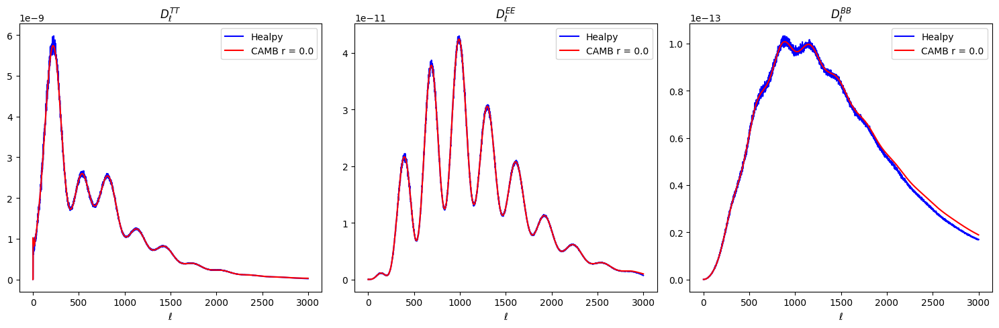

In [ ]:

# -------------- Mean Cls -----------------

mean_Cl_ls = np.zeros((3, config.cmb.lmax+1), dtype=float)  # TT, EE, BB
mean_Cl_ul = np.zeros((3, config.cmb.lmax+1), dtype=float)
# mean_Cl_TE = 0
for sim in range(config.cmb.nsim):

    outputs = {
    "Cls": path_cls / f"lmax_{config.cmb.lmax}.npz",
    "alm_unl": path_alm_unl / f"lmax_{config.cmb.lmax}_sim_{sim+1:04d}.npz",
    "alm_phi": path_alm_phi / f"lmax_{config.cmb.lmax}_sim_{sim+1:04d}.npz",
    "alm_len": path_alm_len / f"lmax_{config.cmb.lmax}_sim_{sim+1:04d}.npz",
    }

    # --------- Load unlensed alm ----------------

    alm_unl = simulator.load_npz(outputs["alm_unl"])

    # --------- Load lensed alm ----------------

    alm_len = simulator.load_npz(outputs["alm_len"])

    # lista de alms orden T, E y B 
    for j, name in enumerate(names):

        alm_lensed = alm_len[f"alm_{name}"] 

        alm_unlensed = alm_unl[f"alm_{name}"]

        mean_Cl_ls[j] += hp.sphtfunc.alm2cl(alm_lensed, alm_lensed, lmax=config.cmb.lmax)*factor
        mean_Cl_ul[j] += hp.sphtfunc.alm2cl(alm_unlensed, alm_unlensed, lmax=config.cmb.lmax)*factor


mean_Cl_ls = mean_Cl_ls/config.cmb.nsim
mean_Cl_ul = mean_Cl_ul/config.cmb.nsim

for i,name in enumerate(names):
    np.savetxt(os.path.join(path_cls , f"Mean_Cl_ls_{name}{name}.txt"), mean_Cl_ls[i])
    np.savetxt(os.path.join(path_cls , f"Mean_Cl_ul_{name}{name}.txt"), mean_Cl_ul[i])


fig, ax = plt.subplots(1, 3, figsize=(15, 5))

ax[0].plot(ells, mean_Cl_ls[0],color='b',label='Healpy') 
ax[0].plot(ells, cl_len[:, 0]*factor,color="r",label=f"CAMB r = {config.cmb.r}")
ax[0].set_title(r'$D_\ell^{TT}$')
ax[0].legend()
ax[0].set_xlabel(r'$\ell$')

ax[1].plot(ells, mean_Cl_ls[1],color='b',label='Healpy') 
ax[1].plot(ells, cl_len[:, 1]*factor,color="r",label=f"CAMB r = {config.cmb.r}")
ax[1].set_title(r'$D_\ell^{EE}$')
ax[1].legend()
ax[1].set_xlabel(r'$\ell$')

ax[2].plot(ells, mean_Cl_ls[2],color='b',label='Healpy') 
ax[2].plot(ells, cl_len[:, 2]*factor,color="r",label=f"CAMB r = {config.cmb.r}")
ax[2].set_title(r'$D_\ell^{BB}$')
ax[2].legend()
ax[2].set_xlabel(r'$\ell$')

plt.tight_layout()
plt.show()


In [ ]:
# --------- Load lensing potential alm ----------------

alm_phi = simulator.load_npz(outputs["alm_phi"])

## Maps CMB

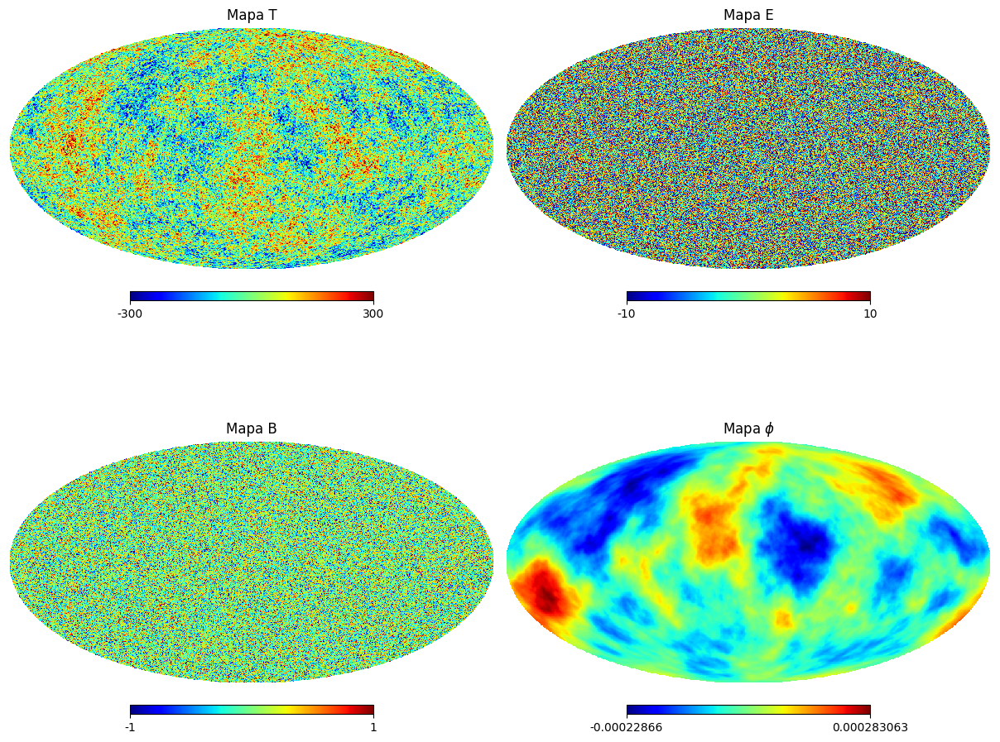

In [ ]:
# Mapas de CMB (T, E, B) y potencial de lensing para una realizacion.
sim = 1

alm_len = np.load(path_alm_len / f"lmax_{config.cmb.lmax}_sim_{sim:04d}.npz")
almT = alm_len["alm_T"]
almE = alm_len["alm_E"]
almB = alm_len["alm_B"]

alm_phi1 = np.load(path_alm_phi / f"lmax_{config.cmb.lmax}_sim_{sim:04d}.npz")["alm_phi"]

nside = config.cmb.nside
lmax  = config.cmb.lmax

map_T  = hp.alm2map(almT, nside=nside, lmax=lmax)
map_E  = hp.alm2map(almE, nside=nside, lmax=lmax)
map_B  = hp.alm2map(almB, nside=nside, lmax=lmax)
map_ph = hp.alm2map(alm_phi1, nside=nside, lmax=lmax)

plt.figure(figsize=(12, 10))
hp.mollview(map_T,  title="Mapa T",   min=-300, max=300, sub=(2, 2, 1), cmap="jet")
hp.mollview(map_E,  title="Mapa E",   min=-10, max=10, sub=(2, 2, 2), cmap="jet")
hp.mollview(map_B,  title="Mapa B",   min=-1, max=1, sub=(2, 2, 3), cmap="jet")
hp.mollview(map_ph, title="Mapa $\phi$", sub=(2, 2, 4), cmap="jet")
plt.show()


## Foreground

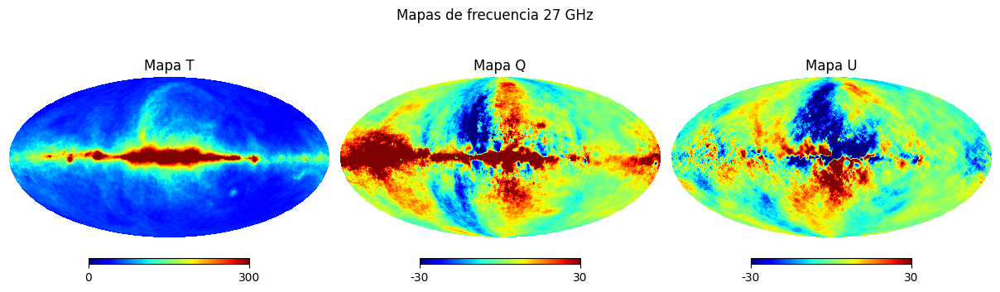

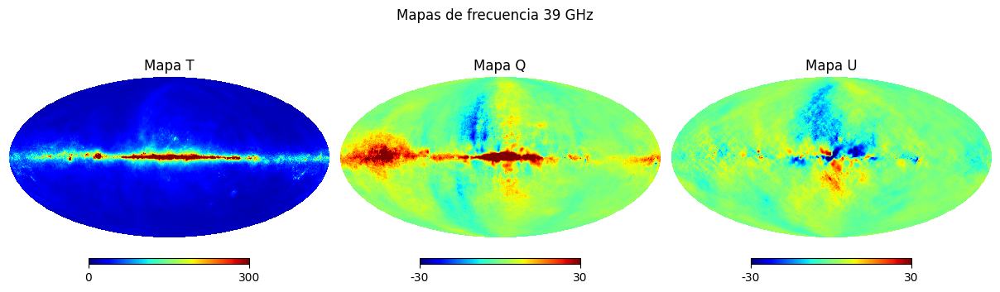

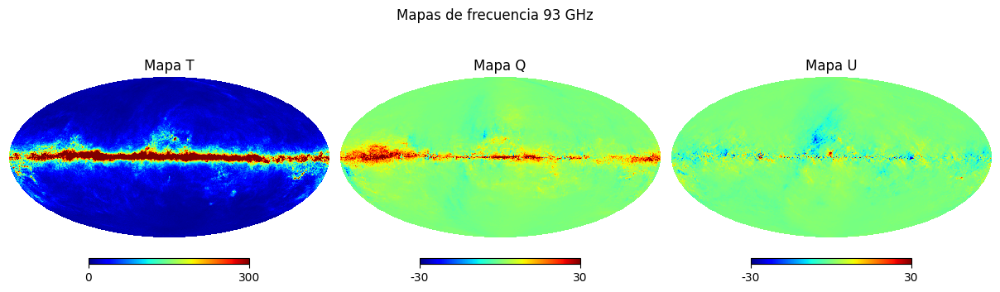

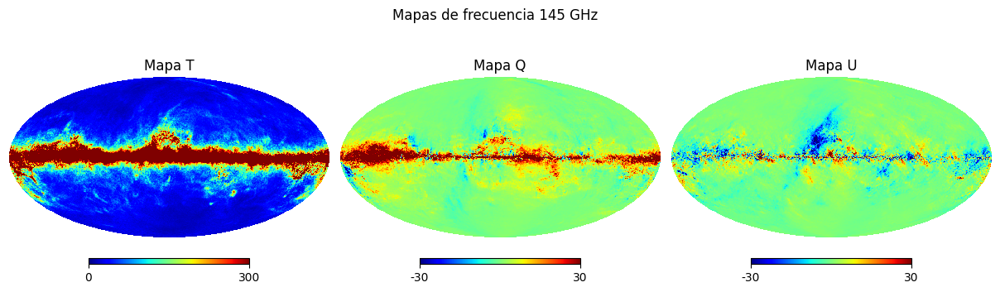

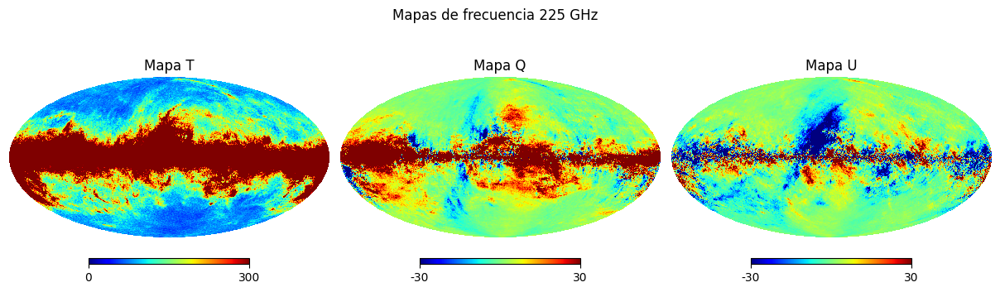

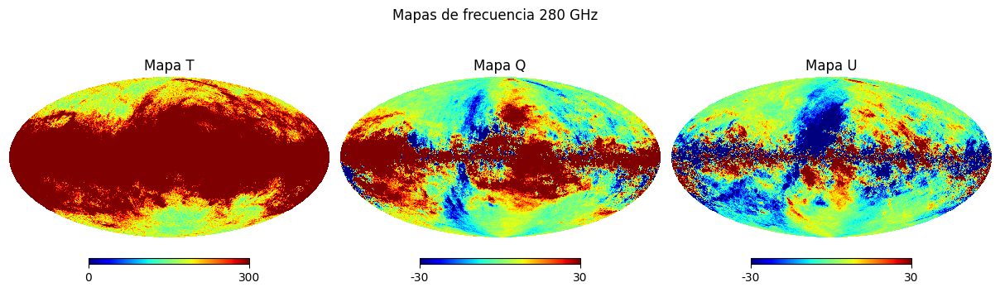

In [12]:
cmb_config = CmbConfig(
    nside = 2048,
    nsim = 10,
    lmax = 3000,
    r = 0.00,
    )

foreground_config = ForegroundConfig(
    models=["s6", "d11"],
    freq=[27, 39, 93, 145, 225, 280], 
    nside=2048,
    lmax=3000,
    nsim=10,
)

config = Config(
    base_dir="outputs_main",
    cmb=cmb_config,
    foreground=foreground_config,
)

simulator = ForegroundSimulator(Config=config)
names = ["T", "E", "B"]

sim = 1

for freq in foreground_config.freq:
    path_alm = paths.foreground_alms_dir(model_tag=paths.model_tag(models=foreground_config.models), frequency_ghz=freq)

    outputs = path_alm / f"nside_{foreground_config.nside}_lmax_{foreground_config.lmax}_sim_{sim+1:04d}.npz"

    alms = simulator.load_npz(outputs)

    alms = [alms[f"alm_{name}"] for name in names]
    
    map_for_T, map_for_Q, map_for_U = hp.alm2map(alms, nside=foreground_config.nside, lmax=foreground_config.lmax ,pol=True)


    plt.figure(figsize=(12,10))
    plt.suptitle(f"Mapas de frecuencia {freq} GHz",y=0.85) #El y controla que tan arriba queda
    hp.mollview(map_for_T, title="Mapa T", min=0, max=300, sub=(2,3,1), cmap = "jet") # ,min=-300, max=300
    hp.mollview(map_for_Q, title="Mapa Q", min=-30, max=30, sub=(2,3,2), cmap = "jet") #, min=-30, max=30
    hp.mollview(map_for_U, title="Mapa U", min=-30, max=30, sub=(2,3,3), cmap = "jet") # , min=-30, max=30
    plt.show()


    

## Noise

[LOAD] White-noise spectra: /home/jorge/Escritorio/Proy_cosmo/Cosmo_MSc/outputs_main/simulations/noise/SO_LAT/white/cls/freq_27_lmax_3000.npz
[LOAD] White-noise alms: /home/jorge/Escritorio/Proy_cosmo/Cosmo_MSc/outputs_main/simulations/noise/SO_LAT/white/alms/freq_0027.0/lmax_3000_sim_0001.npz
[LOAD] White-noise spectra: /home/jorge/Escritorio/Proy_cosmo/Cosmo_MSc/outputs_main/simulations/noise/SO_LAT/white/cls/freq_39_lmax_3000.npz
[LOAD] White-noise alms: /home/jorge/Escritorio/Proy_cosmo/Cosmo_MSc/outputs_main/simulations/noise/SO_LAT/white/alms/freq_0039.0/lmax_3000_sim_0001.npz
[LOAD] White-noise spectra: /home/jorge/Escritorio/Proy_cosmo/Cosmo_MSc/outputs_main/simulations/noise/SO_LAT/white/cls/freq_93_lmax_3000.npz
[LOAD] White-noise alms: /home/jorge/Escritorio/Proy_cosmo/Cosmo_MSc/outputs_main/simulations/noise/SO_LAT/white/alms/freq_0093.0/lmax_3000_sim_0001.npz
[LOAD] White-noise spectra: /home/jorge/Escritorio/Proy_cosmo/Cosmo_MSc/outputs_main/simulations/noise/SO_LAT/white

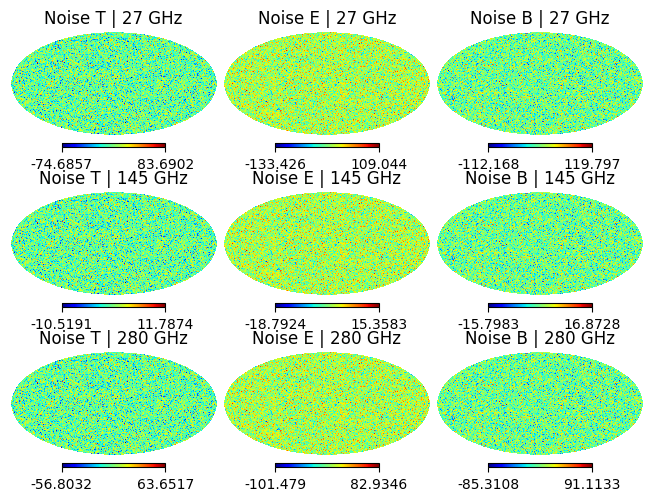

In [3]:
from src.simulations.noise_simulator import NoiseSimulator
from src.simulations.config import NoiseConfig

# Generate white-noise maps for SO LAT (MBAC) if not present yet.
noise_config = NoiseConfig(
    model="white",
    experiment="SO_LAT",
    freq=[27, 39, 93, 145, 225, 280],
    noise_t=[71, 36, 8.0, 10, 22, 54],
    noise_p=np.array([71, 36, 8.0, 10, 22, 54]) * np.sqrt(2),
    nside=config.cmb.nside,
    lmax=config.cmb.lmax,
    nsim=1,
)
sim_config = Config(base_dir=config.base_dir, noise=noise_config)
NoiseSimulator(sim_config).simulate_one(sim=1)

# Plot the noise maps (T, E, B) for a few frequencies.
freqs = [27, 145, 280]
nrows, ncols = 3, len(freqs)
i = 1
for f in freqs:
    alm_file = (
        paths.noise_alms_dir(experiment="SO_LAT", frequency_ghz=f, noise_model="white")
        / f"lmax_{config.cmb.lmax}_sim_0001.npz"
    )
    data = np.load(alm_file)
    for name in ["alm_T", "alm_E", "alm_B"]:
        m = hp.alm2map(data[name], nside=config.cmb.nside, lmax=config.cmb.lmax)
        hp.mollview(m, title=f"Noise {name[4]} | {f} GHz", sub=(nrows, ncols, i), cmap="jet")
        i += 1
plt.show()


## Cleaning

# ILC Cleaning

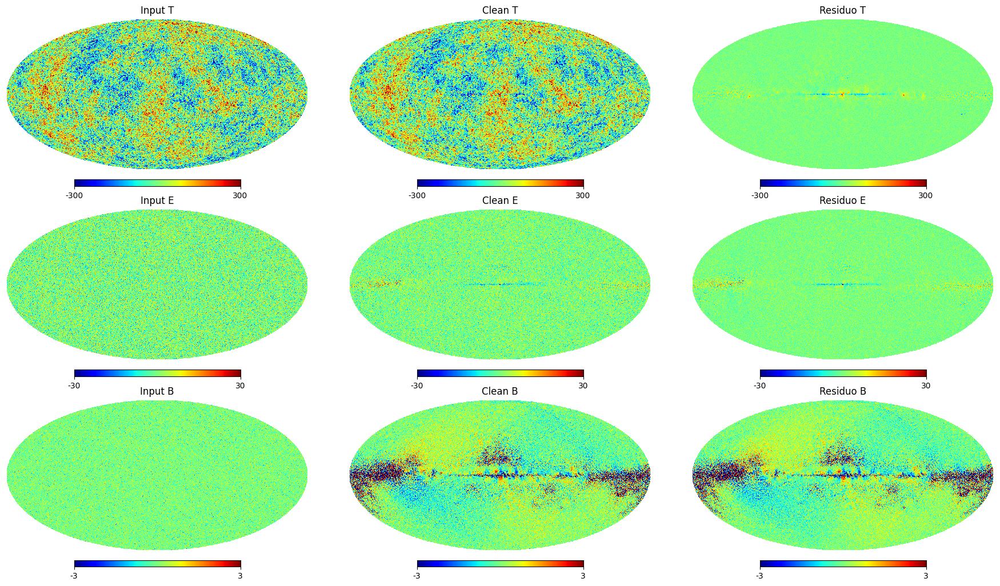

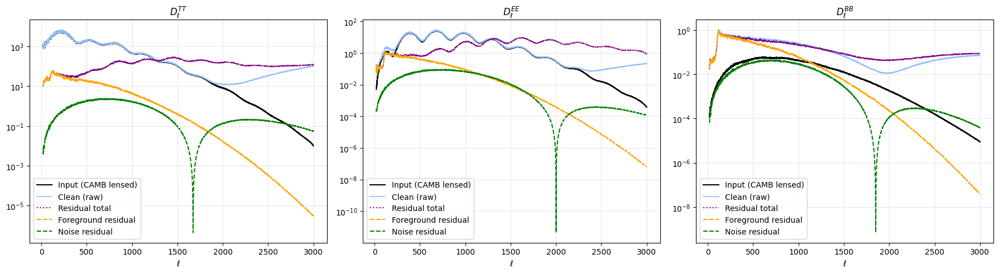

In [ ]:
from pathlib import Path

sim   = 1
nside = config.cmb.nside
lmax  = config.cmb.lmax
beam_out = 7.4  # fwhm_out de BROOM
names = ["T", "E", "B"]

files_dir = Path(
    "outputs_main/products/component_separation/"
    "ilc_pixel_bias0.0/cmb_reconstruction"
)

def load_cs_maps(name):
    path = paths.path_output_cs(
        files_dir=files_dir, name=name,
        sim=sim, lmax=lmax, nside=nside, beam_out=beam_out,
    )
    m = hp.read_map(path, field=None)  # (3, npix) -> T, E, B
    return m if m.ndim == 2 else m[None, :]

maps_cl = load_cs_maps("output_total")       # T, E, B limpios
maps_fg = load_cs_maps("fgds_residuals")     # T, E, B residuo foreground
maps_ns = load_cs_maps("noise_residuals")    # T, E, B residuo ruido

# Input (lenteado real) desde alms
alm_len = np.load(path_alm_len / f"lmax_{lmax}_sim_{sim:04d}.npz")
alms_in = [alm_len[f"alm_{n}"] for n in names]
maps_in = [hp.alm2map(a, nside=nside, lmax=lmax) for a in alms_in]

maps_re = [maps_cl[i] - maps_in[i] for i in range(3)]

# ---------- (a) Mapas: Input vs Clean + Residuo ----------
vlim = {"T": 300, "E": 30, "B": 3}
fig = plt.figure(figsize=(18, 10))
for j, name in enumerate(names):
    vl = vlim[name]
    hp.mollview(maps_in[j], title=f"Input {name}", min=-vl, max=vl, sub=(3, 3, 3*j+1), cmap="jet")
    hp.mollview(maps_cl[j], title=f"Clean {name}", min=-vl, max=vl, sub=(3, 3, 3*j+2), cmap="jet")
    hp.mollview(maps_re[j], title=f"Residuo {name}", min=-vl, max=vl, sub=(3, 3, 3*j+3), cmap="jet")
plt.show()

# ---------- (b) Espectros: input, clean, residuo, fgds y ruido ----------
factor = ells * (ells + 1) / (2 * np.pi)

# Filtro (beam) no es necesario el pixel  
b = hp.gauss_beam(fwhm=beam_out * np.pi / (180 * 60), lmax=lmax, pol=True)
# pixT, pixP = hp.pixwin(nside, pol=True, lmax=lmax)
Filter = [b[:, 0], b[:, 1], b[:, 2]]

def cl_from_maps(maps):
    return [hp.alm2cl(hp.almxfl(hp.map2alm(maps[i], lmax=lmax), Filter[i]))
            * factor for i in range(3)]

Cl_in  = [hp.alm2cl(hp.almxfl(alms_in[i], Filter[i]), lmax=lmax) * factor
          for i in range(3)]
Cl_raw = [hp.alm2cl(hp.map2alm(maps_cl[i], lmax=lmax), lmax=lmax) * factor
          for i in range(3)]
Cl_res = [hp.alm2cl(hp.map2alm(maps_re[i], lmax=lmax), lmax=lmax) * factor
          for i in range(3)]
Cl_fg  = cl_from_maps(maps_fg)
Cl_ns  = cl_from_maps(maps_ns)

fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharex=True)
for j, name in enumerate(names):
    ax = axes[j]
    ax.plot(ells[20:], Cl_in[j][20:],  color="black", lw=1.5, label="Input (CAMB lensed)")
    ax.plot(ells[20:], Cl_raw[j][20:], color="#91c0ff", lw=1.2, label="Clean (raw)")
    ax.plot(ells[20:], Cl_res[j][20:], color="purple",  ls=":", label="Residual total")
    ax.plot(ells[20:], Cl_fg[j][20:],  color="orange", ls="--", label="Foreground residual")
    ax.plot(ells[20:], Cl_ns[j][20:],  color="green",  ls="--", label="Noise residual")
    ax.set_yscale("log")
    ax.set_xlabel(r"$\ell$")
    ax.set_title(rf"$D_\ell^{{{name}{name}}}$")
    ax.legend(); ax.grid(True, which="both", alpha=0.3)
plt.tight_layout(); plt.show()



# NILC Cosine Cleaning

ValueError: x and y must have same first dimension, but have shapes (2988,) and (3001, 12)

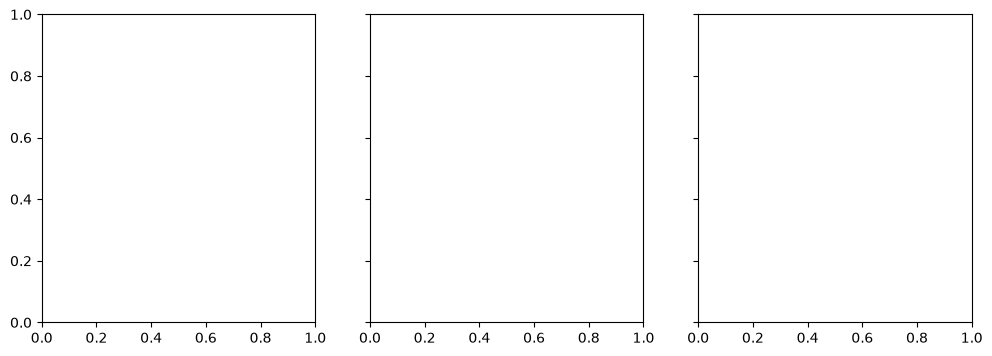

In [6]:
from broom.needlets import _get_needlet_windows_
import matplotlib.pyplot as plt
import numpy as np

lmax = 3000

# Cosine needlets
needlet_config = {}
needlet_config["needlet_windows"] = "cosine"
needlet_config["ell_peaks"] = [0, 30, 60, 100, 180, 300, 500, 800, 1200, 1800, 2400, 3000]
bl_cos = _get_needlet_windows_(needlet_config=needlet_config, lmax=lmax)
ells = np.arange(12, lmax)


# Standard needlets
needlet_config = {}
needlet_config["needlet_windows"] = "standard"
needlet_config["width"] = 2. 
needlet_config["merging_needlets"] = [0, 5] 
bl_stand = _get_needlet_windows_(needlet_config=needlet_config, lmax=lmax)

# Mexican needlets
needlet_config = {}
needlet_config["needlet_windows"] = "mexican"
needlet_config["width"] = 1.3 
needlet_config["merging_needlets"] = [0, 14, 17, 19, 40] #
bl_mex = _get_needlet_windows_(needlet_config=needlet_config, lmax=lmax)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4), sharex=True, sharey=True)
ax1.plot(ells,bl_cos.T)
ax2.plot(ells,bl_stand.T)
ax3.plot(ells,bl_mex.T)

ax1.set_xlim(2,config.lmax)
ax1.set_ylim(0.,1.)

ax1.set_title("Cosine needlets")
ax2.set_title("Standard needlets")
ax3.set_title("Mexican needlets")

fig.supxlabel(r"$\ell$")
fig.supylabel(r"$b(\ell)$")
plt.tight_layout()


In [ ]:
# Remember always to check that np.sum(needlet_bands**2,axis=0) = 1 at each ell so as to recover the full CMB signal

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4), sharex=True, sharey=True)
ax1.plot(ells,np.sum(bl_cos**2,axis=0))
ax2.plot(ells,np.sum(bl_stand**2,axis=0))
ax3.plot(ells,np.sum(bl_mex**2,axis=0))

ax1.set_xlim(2,config.lmax)
ax1.set_ylim(0.9,1.1)

ax1.set_title("Cosine needlets")
ax2.set_title("Standard needlets")
ax3.set_title("Mexican needlets")

fig.supxlabel(r"$\ell$")
fig.supylabel(r"$b(\ell)$")
plt.tight_layout()

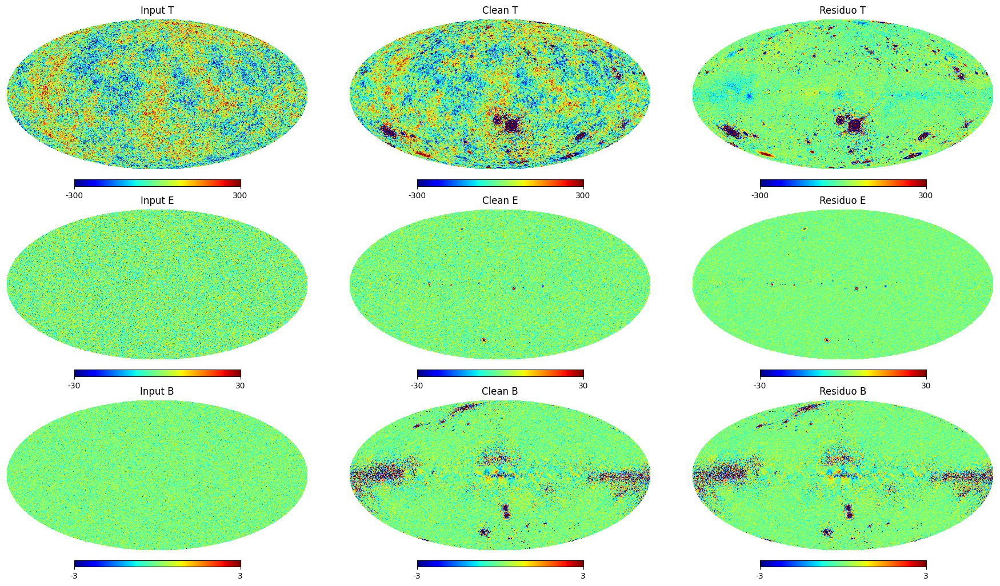

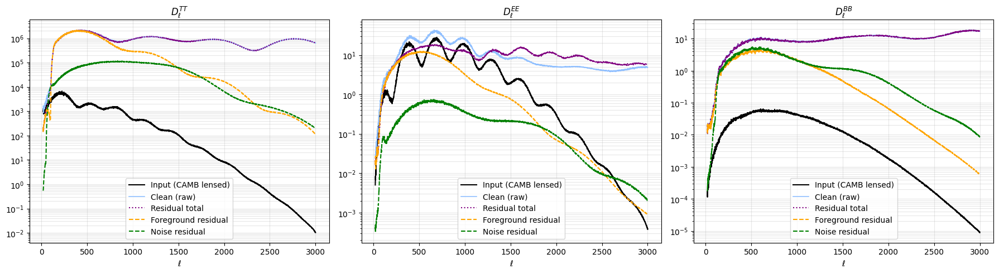

In [3]:
from pathlib import Path

sim   = 1
nside = config.cmb.nside
lmax  = config.cmb.lmax
beam_out = 7.4  # fwhm_out de BROOM
names = ["T", "E", "B"]

files_dir = Path(
    "outputs_main/products/component_separation/"
    "ilc_needlet_bias0.1_noidebias0.2_nls0-1-2-3/"
    "cosine_0_50_100_150/cmb_reconstruction"
)

def load_cs_maps(name):
    path = paths.path_output_cs(
        files_dir=files_dir, name=name,
        sim=sim, lmax=lmax, nside=nside, beam_out=beam_out,
    )
    m = hp.read_map(path, field=None)  # (3, npix) -> T, E, B
    return m if m.ndim == 2 else m[None, :]

maps_cl = load_cs_maps("output_total")       # T, E, B limpios
maps_fg = load_cs_maps("fgds_residuals")     # T, E, B residuo foreground
maps_ns = load_cs_maps("noise_residuals")    # T, E, B residuo ruido

# Input (lenteado real) desde alms
alm_len = np.load(path_alm_len / f"lmax_{lmax}_sim_{sim:04d}.npz")
alms_in = [alm_len[f"alm_{n}"] for n in names]
maps_in = [hp.alm2map(a, nside=nside, lmax=lmax) for a in alms_in]

maps_re = [maps_cl[i] - maps_in[i] for i in range(3)]

# ---------- (a) Mapas: Input vs Clean + Residuo ----------
vlim = {"T": 300, "E": 30, "B": 3}
fig = plt.figure(figsize=(18, 10))
for j, name in enumerate(names):
    vl = vlim[name]
    hp.mollview(maps_in[j], title=f"Input {name}", min=-vl, max=vl, sub=(3, 3, 3*j+1), cmap="jet")
    hp.mollview(maps_cl[j], title=f"Clean {name}", min=-vl, max=vl, sub=(3, 3, 3*j+2), cmap="jet")
    hp.mollview(maps_re[j], title=f"Residuo {name}", min=-vl, max=vl, sub=(3, 3, 3*j+3), cmap="jet")
plt.show()

# ---------- (b) Espectros: input, clean, residuo, fgds y ruido ----------
factor = ells * (ells + 1) / (2 * np.pi)

# Filtro (beam) no es necesario el pixel  
b = hp.gauss_beam(fwhm=beam_out * np.pi / (180 * 60), lmax=lmax, pol=True)
# pixT, pixP = hp.pixwin(nside, pol=True, lmax=lmax)
Filter = [b[:, 0], b[:, 1], b[:, 2]]

def cl_from_maps(maps):
    return [hp.alm2cl(hp.almxfl(hp.map2alm(maps[i], lmax=lmax), Filter[i]))
            * factor for i in range(3)]

Cl_in  = [hp.alm2cl(hp.almxfl(alms_in[i], Filter[i]), lmax=lmax) * factor
          for i in range(3)]
Cl_raw = [hp.alm2cl(hp.map2alm(maps_cl[i], lmax=lmax), lmax=lmax) * factor
          for i in range(3)]
Cl_res = [hp.alm2cl(hp.map2alm(maps_re[i], lmax=lmax), lmax=lmax) * factor
          for i in range(3)]
Cl_fg  = cl_from_maps(maps_fg)
Cl_ns  = cl_from_maps(maps_ns)

fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharex=True)
for j, name in enumerate(names):
    ax = axes[j]
    ax.plot(ells[20:], Cl_in[j][20:],  color="black", lw=1.5, label="Input (CAMB lensed)")
    ax.plot(ells[20:], Cl_raw[j][20:], color="#91c0ff", lw=1.2, label="Clean (raw)")
    ax.plot(ells[20:], Cl_res[j][20:], color="purple",  ls=":", label="Residual total")
    ax.plot(ells[20:], Cl_fg[j][20:],  color="orange", ls="--", label="Foreground residual")
    ax.plot(ells[20:], Cl_ns[j][20:],  color="green",  ls="--", label="Noise residual")
    ax.set_yscale("log")
    ax.set_xlabel(r"$\ell$")
    ax.set_title(rf"$D_\ell^{{{name}{name}}}$")
    ax.legend(); ax.grid(True, which="both", alpha=0.3)
plt.tight_layout(); plt.show()


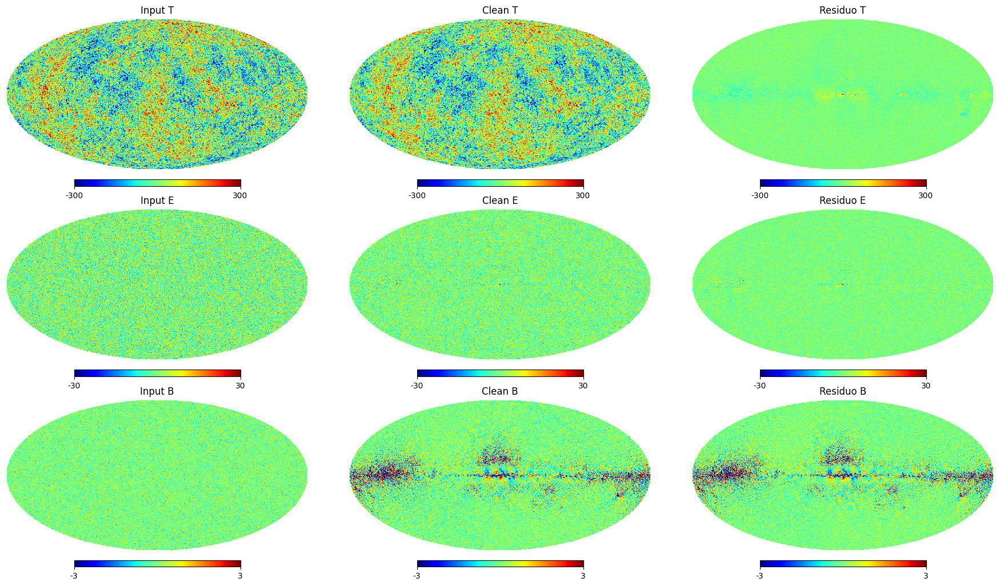

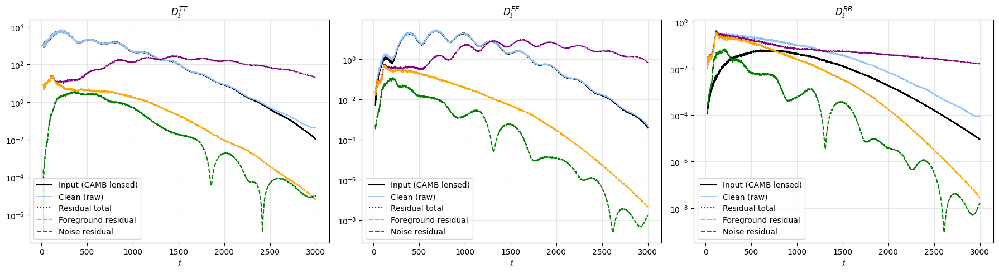

In [4]:
from pathlib import Path

sim   = 1
nside = config.cmb.nside
lmax  = config.cmb.lmax
beam_out = 7.4  # fwhm_out de BROOM
names = ["T", "E", "B"]

files_dir = Path(
    "outputs_main/products/component_separation/ilc_needlet_bias0.001/cosine_0_30_60_100_180_300_500_800_1200_1800_2400_3000/cmb_reconstruction"
)

def load_cs_maps(name):
    path = paths.path_output_cs(
        files_dir=files_dir, name=name,
        sim=sim, lmax=lmax, nside=nside, beam_out=beam_out,
    )
    m = hp.read_map(path, field=None)  # (3, npix) -> T, E, B
    return m if m.ndim == 2 else m[None, :]

maps_cl = load_cs_maps("output_total")       # T, E, B limpios
maps_fg = load_cs_maps("fgds_residuals")     # T, E, B residuo foreground
maps_ns = load_cs_maps("noise_residuals")    # T, E, B residuo ruido

# Input (lenteado real) desde alms
alm_len = np.load(path_alm_len / f"lmax_{lmax}_sim_{sim:04d}.npz")
alms_in = [alm_len[f"alm_{n}"] for n in names]
maps_in = [hp.alm2map(a, nside=nside, lmax=lmax) for a in alms_in]

maps_re = [maps_cl[i] - maps_in[i] for i in range(3)]

# ---------- (a) Mapas: Input vs Clean + Residuo ----------
vlim = {"T": 300, "E": 30, "B": 3}
fig = plt.figure(figsize=(18, 10))
for j, name in enumerate(names):
    vl = vlim[name]
    hp.mollview(maps_in[j], title=f"Input {name}", min=-vl, max=vl, sub=(3, 3, 3*j+1), cmap="jet")
    hp.mollview(maps_cl[j], title=f"Clean {name}", min=-vl, max=vl, sub=(3, 3, 3*j+2), cmap="jet")
    hp.mollview(maps_re[j], title=f"Residuo {name}", min=-vl, max=vl, sub=(3, 3, 3*j+3), cmap="jet")
plt.show()

# ---------- (b) Espectros: input, clean, residuo, fgds y ruido ----------
factor = ells * (ells + 1) / (2 * np.pi)

# Filtro (beam) no es necesario el pixel  
b = hp.gauss_beam(fwhm=beam_out * np.pi / (180 * 60), lmax=lmax, pol=True)
# pixT, pixP = hp.pixwin(nside, pol=True, lmax=lmax)
Filter = [b[:, 0], b[:, 1], b[:, 2]]

def cl_from_maps(maps):
    return [hp.alm2cl(hp.almxfl(hp.map2alm(maps[i], lmax=lmax), Filter[i]))
            * factor for i in range(3)]

Cl_in  = [hp.alm2cl(hp.almxfl(alms_in[i], Filter[i]), lmax=lmax) * factor
          for i in range(3)]
Cl_raw = [hp.alm2cl(hp.map2alm(maps_cl[i], lmax=lmax), lmax=lmax) * factor
          for i in range(3)]
Cl_res = [hp.alm2cl(hp.map2alm(maps_re[i], lmax=lmax), lmax=lmax) * factor
          for i in range(3)]
Cl_fg  = cl_from_maps(maps_fg)
Cl_ns  = cl_from_maps(maps_ns)

fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharex=True)
for j, name in enumerate(names):
    ax = axes[j]
    ax.plot(ells[20:], Cl_in[j][20:],  color="black", lw=1.5, label="Input (CAMB lensed)")
    ax.plot(ells[20:], Cl_raw[j][20:], color="#91c0ff", lw=1.2, label="Clean (raw)")
    ax.plot(ells[20:], Cl_res[j][20:], color="purple",  ls=":", label="Residual total")
    ax.plot(ells[20:], Cl_fg[j][20:],  color="orange", ls="--", label="Foreground residual")
    ax.plot(ells[20:], Cl_ns[j][20:],  color="green",  ls="--", label="Noise residual")
    ax.set_yscale("log")
    ax.set_xlabel(r"$\ell$")
    ax.set_title(rf"$D_\ell^{{{name}{name}}}$")
    ax.legend(); ax.grid(True, which="both", alpha=0.3)
plt.tight_layout(); plt.show()

## Wiener filter

## Lensing Potential

In [ ]:
from pathlib import Path
from curvedsky import utils as cs_utils

# Load the reconstructed potential (glmMV) and the input phi for one sim.
sim = 1

alm_phi1 = np.load(path_alm_phi / f"lmax_{config.cmb.lmax}_sim_{sim:04d}.npz")["alm_phi"]

rec_path = Path("outputs_main/products/lensing") / f"rec_pot_{sim}.npz"
rec = np.load(rec_path)
glmMV = rec["glmMV"]

# Power spectra: reconstruction (2D/['l,m'] alm), input, and theory.
cl_recon  = cs_utils.alm2cl(lmax=config.cmb.lmax, alm1=glmMV)
cl_input  = hp.alm2cl(alm_phi1, lmax=config.cmb.lmax)
cl_theory = powers["lens_potential"][:, 0]

ell = powers["ell"]
sel = np.arange(2, config.cmb.lmax + 1)

plt.figure(figsize=(8, 6))
plt.loglog(ell[sel], cl_theory[sel], "k-",  label=r"Theory $C_L^{\phi\phi}$ (CAMB)")
plt.loglog(ell[sel], cl_input[sel], "r--", label=r"Input $\phi$ alm")
plt.loglog(ell[sel], cl_recon[sel], "b-",  label="MV reconstruction")
plt.xlabel(r"$L$")
plt.ylabel(r"$C_L^{\phi\phi}$")
plt.legend()
plt.grid(True, which="both", alpha=0.3)
plt.title("Lensing potential power spectrum")
plt.show()
